In [1]:
pip install requests beautifulsoup4

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pillow

Note: you may need to restart the kernel to use updated packages.


In [13]:
import matplotlib.pyplot as plt
import requests
from bs4 import BeautifulSoup
import numpy as np
import re
import matplotlib.animation as animation
import imageio
import os
import statistics

In [4]:
def get_data(ls_value):
    url = f"https://www-mars.lmd.jussieu.fr/mcd_python/cgi-bin/mcdcgi.py?var1=vmr_o3&var2=none&var3=none&var4=none&datekeyhtml=1&ls={ls_value}&localtime=0.&year=2025&month=2&day=17&hours=14&minutes=54&seconds=36&julian=2460724.1212500003&martianyear=38&sol=95&latitude=60&longitude=all&altitude=30000&zkey=3&spacecraft=none&isfixedlt=off&dust=1&hrkey=1&averaging=off&dpi=80&islog=off&colorm=jet&minval=&maxval=&proj=cyl&palt=&plon=&plat=&trans=&iswind=off&latpoint=&lonpoint="
    response = requests.get(url)
    return response
    
soup = BeautifulSoup((get_data(0).content), 'html.parser')

links = soup.find_all('a', href=True)

for link in links:
    print(link['href'])

../txt/4d424adc66b1f3a7becc989180460a9b.txt


In [5]:
import requests
from bs4 import BeautifulSoup
import numpy as np

links_for_data = []

def get_data(ls_value):
    url = f"https://www-mars.lmd.jussieu.fr/mcd_python/cgi-bin/mcdcgi.py?var1=vmr_o3&var2=none&var3=none&var4=none&datekeyhtml=1&ls={ls_value}&localtime=0.&year=2025&month=2&day=17&hours=14&minutes=54&seconds=36&julian=2460724.1212500003&martianyear=38&sol=95&latitude=60&longitude=all&altitude=30000&zkey=3&spacecraft=none&isfixedlt=off&dust=1&hrkey=1&averaging=off&dpi=80&islog=off&colorm=jet&minval=&maxval=&proj=cyl&palt=&plon=&plat=&trans=&iswind=off&latpoint=&lonpoint="
    response = requests.get(url)
    return response

ls_values = np.arange(0,361)
def get_links():
    for ls_value in range(0,361):
        soup = BeautifulSoup((get_data(ls_value).content), 'html.parser')
        links = soup.find_all('a', href=True)
        for link in links:
            original_link = str(link['href'])
            modified_link = original_link.replace("..","https://www-mars.lmd.jussieu.fr/mcd_python")
            links_for_data.append(modified_link)
    return links_for_data

links_for_data = get_links()
print(links_for_data)

['https://www-mars.lmd.jussieu.fr/mcd_python/txt/4d424adc66b1f3a7becc989180460a9b.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/fa52281e8a5d449566c790971a02ecac.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/fcc8a86f80811a6f12c7435c21eea56a.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/f55b847047e5d1a670eb73779eeac512.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/89e302cb463e396289f8736c23ab1c00.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/49d6bd78e8d186d5c316136b4ecc2d80.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/6eb0d5bf1e83f9ee6a8d5d75c1fe441e.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/97d8a500df9c0f1ec4b8854c3fc92d44.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/f270cedbe859e92fa04a465fe462ca91.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/3e0e72576d2a06296e3eed73835cbda9.txt', 'https://www-mars.lmd.jussieu.fr/mcd_python/txt/920314ed4b9362e265a77e0df66aed64.txt', 'https://www-mars.lmd.jussieu.fr/mcd_pytho

need to add
'https://www-mars.lmd.jussieu.fr/mcd_python/'
to the start of each of the 'links', without the ..

In [6]:
url_0 = links_for_data[0]
response = requests.get(url_0)

if response.status_code ==200:
    text_0 = response.text
    parts = text_0.split('##########################################################################################\n')
    result = parts[2]
    pairs = result.split('\n')
    
#    for pair in pairs:
 #       array = pair.split('    ')
  #  array = np.array(array)
   # array = [pair.split('    ') for pair in pairs]
    #array = np.array(array)
    #print(array)
        #3 spaces before a -
        #4 spaces before a positive number
        #get rid of gap
        #use pattern instead
else:
    print("failed to retrieve file")
pairs_clean = list(filter(None, pairs))
print(pairs_clean)
data = np.array(pairs)
print(data)
longitudes = []
temperatures = []

for i in data:
    x=re.findall(r'([0-9.e\+\-]+)',i)
    
    if len(x) !=0:
    
        longitudes.append(float(x[0]))
        temperatures.append(float(x[1]))
print(longitudes)
print(temperatures)

['   -1.80000e+02    6.45792e-08', '   -1.74286e+02    6.54485e-08', '   -1.68571e+02    6.59241e-08', '   -1.62857e+02    6.61908e-08', '   -1.57143e+02    6.63567e-08', '   -1.51429e+02    6.62684e-08', '   -1.45714e+02    6.60546e-08', '   -1.40000e+02    6.57246e-08', '   -1.34286e+02    6.51922e-08', '   -1.28571e+02    6.46666e-08', '   -1.22857e+02    6.39748e-08', '   -1.17143e+02    6.32316e-08', '   -1.11429e+02    6.27981e-08', '   -1.05714e+02    6.28639e-08', '   -1.00000e+02    6.34805e-08', '   -9.42857e+01    6.59460e-08', '   -8.85714e+01    7.28960e-08', '   -8.28571e+01    8.54393e-08', '   -7.71429e+01    1.01507e-07', '   -7.14286e+01    1.17959e-07', '   -6.57143e+01    1.30403e-07', '   -6.00000e+01    1.39041e-07', '   -5.42857e+01    1.41897e-07', '   -4.85714e+01    1.47021e-07', '   -4.28571e+01    1.52077e-07', '   -3.71429e+01    1.57727e-07', '   -3.14286e+01    1.60017e-07', '   -2.57143e+01    1.68719e-07', '   -2.00000e+01    1.70022e-07', '   -1.42857e

#now have text files in a list. need to create code first to read just one.
#read after the hashtag header - splitting
#2 columns: first is east longitude
#2nd is temperature.

#then code to iterate over the list of text files
#storing the arrays

#graphing of the arrays. Time (over the solar year) vs average temperature
#temperature should have uncertainty bars for the maximum and minimum temperature of that solar longitude.

#repeat for o3 density

#repeat for o3 mixing ratio
def all_temperature():
    for i in range(len(links_for_data) + 1):
        url = links_for_data[i]
        response = requests.get(url)
    
        if response.status_code ==200:
            text_i = response.text
            parts = text_i.split('##########################################################################################\n')
            result = parts[2]
            pairs = result.split('\n')

    
        else:
            print("failed to retrieve file")
            
        pairs_clean = list(filter(None, pairs))
        #print(pairs_clean)
        data = np.array(pairs)
        #print(data)
        
        
        temp_lat_arrays = {}
        for i in range(len(links_for_data) + 1)
            temp_lat_arrays[f]
            temperatures = []
        
        for i in data:
        x=re.findall(r'([0-9.e\+\-]+)',i)
    
        if len(x) !=0:
    
            latitudes.append(float(x[0]))
            temperatures.append(float(x[1]))
print(latitudes)
print(temperatures)


In [7]:
def read_url(url_0):
    
    response = requests.get(url_0)

    if response.status_code ==200:
        text_0 = response.text
        parts = text_0.split('##########################################################################################\n')
        result = parts[2]
        pairs = result.split('\n')

    #    for pair in pairs:
     #       array = pair.split('    ')
      #  array = np.array(array)
       # array = [pair.split('    ') for pair in pairs]
        #array = np.array(array)
        #print(array)
            #3 spaces before a -
            #4 spaces before a positive number
            #get rid of gap
            #use pattern instead
    else:
        print("failed to retrieve file")
    pairs_clean = list(filter(None, pairs))
    #print(pairs_clean)
    data = np.array(pairs)
    #print(data)
    longitudes_0 = []
    temperatures_0 = []

    for i in data:
        x=re.findall(r'([0-9.e\+\-]+)',i)

        if len(x) !=0:

            longitudes_0.append(float(x[0]))
            temperatures_0.append(float(x[1]))
            
    return longitudes_0, temperatures_0

In [8]:
longitudes = []
temperatures = []
for i in links_for_data:
    x, y = read_url(i)
    longitudes.append(x)
    temperatures.append(y)

In [9]:
print(longitudes[0],temperatures[0])
print(np.shape(temperatures[0]))
np.array(longitudes)
print(type(longitudes))

[-180.0, -174.286, -168.571, -162.857, -157.143, -151.429, -145.714, -140.0, -134.286, -128.571, -122.857, -117.143, -111.429, -105.714, -100.0, -94.2857, -88.5714, -82.8571, -77.1429, -71.4286, -65.7143, -60.0, -54.2857, -48.5714, -42.8571, -37.1429, -31.4286, -25.7143, -20.0, -14.2857, -8.57143, -2.85714, 2.85714, 8.57143, 14.2857, 20.0, 25.7143, 31.4286, 37.1429, 42.8571, 48.5714, 54.2857, 60.0, 65.7143, 71.4286, 77.1429, 82.8571, 88.5714, 94.2857, 100.0, 105.714, 111.429, 117.143, 122.857, 128.571, 134.286, 140.0, 145.714, 151.429, 157.143, 162.857, 168.571, 174.286, 180.0] [6.45792e-08, 6.54485e-08, 6.59241e-08, 6.61908e-08, 6.63567e-08, 6.62684e-08, 6.60546e-08, 6.57246e-08, 6.51922e-08, 6.46666e-08, 6.39748e-08, 6.32316e-08, 6.27981e-08, 6.28639e-08, 6.34805e-08, 6.5946e-08, 7.2896e-08, 8.54393e-08, 1.01507e-07, 1.17959e-07, 1.30403e-07, 1.39041e-07, 1.41897e-07, 1.47021e-07, 1.52077e-07, 1.57727e-07, 1.60017e-07, 1.68719e-07, 1.70022e-07, 1.74434e-07, 1.78282e-07, 1.79076e-07, 

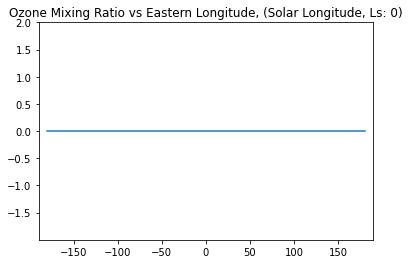

In [10]:
#create a gif
def create_plot():
    x = longitudes[0]
    y = temperatures[0]
    plt.plot(x, y)
    plt.title(f"Ozone Mixing Ratio vs Eastern Longitude, (Solar Longitude, Ls: {0})")
    plt.xlim(-190, 190)
    plt.ylim(np.min(temperatures[0])-2 ,np.max(temperatures[0])+2)

create_plot()

In [14]:
frames_folder = r"C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames"
os.makedirs(frames_folder, exist_ok=True)

def create_plots(longitudes, temperatures):
    filenames = []
    
    for i in range(len(temperatures)): 
        fig, ax = plt.subplots(figsize=(8,6))
        
        x = longitudes[i]  
        y = temperatures[i]  
        
        max_index = np.argmax(y)
        max_x = x[max_index]
        max_y = y[max_index]
        plt.annotate(f'Max O3 Mixing Ratio {max_y} / Longitude {max_x}', xy=(max_x, max_y), xytext=(max_x+1, max_y),
             arrowprops=dict(facecolor='black', shrink=0.05))
        
        min_index = np.argmin(y)
        min_x = x[min_index]
        min_y = y[min_index]
        plt.annotate(f'Min O3 Mixing Ratio {min_y} / Longitude {min_x}', xy=(min_x, min_y), xytext=(min_x+1, min_y),
             arrowprops=dict(facecolor='black', shrink=0.05))
        
        plt.plot(x, y, label=f"Solar Longitude (Ls: {i})", color='blue')

        plt.title("O3 Mixing Ratio vs Eastern Longitude")
        plt.xlabel("Longitude")
        plt.ylabel("O3 Mixing Ratio")
        plt.xlim(-181, 181)
        plt.ylim(np.min(temperatures[i])-statistics.stdev(temperatures[i]), np.max(temperatures[i])+statistics.stdev(temperatures[i]))
        plt.legend(fontsize=10)
    
    #plt.show()
    
        filename = os.path.join(frames_folder, f"frame_{i:03d}.png")
        try:   
            fig.savefig(filename)
            print(f"Successfully saved: {filename}")
            filenames.append(filename)
            
        except Exception as e:
            print(f"Error saving {filename}: {e}")
            
    plt.close(fig)
    
    return filenames
    
#create_plots(longitudes,temperatures) too much memory: close figs and make gif.


Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_000.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_001.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_002.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_003.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_004.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_005.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_006.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_007.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

C:\Users\thoma\AppData\Local\Temp/ipykernel_22472/996457991.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8,6))


Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_023.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_024.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_025.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_026.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_027.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_028.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_029.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_030.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_096.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_097.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_098.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_099.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_100.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_101.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_102.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_103.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_169.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_170.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_171.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_172.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_173.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_174.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_175.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_176.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_240.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_241.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_242.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_243.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_244.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_245.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_246.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_247.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_313.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_314.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_315.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_316.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_317.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_318.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_319.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/Latitude vs Temperature frames\frame_320.png
Successfully saved: C:/Users/thoma/OneDrive/Desktop/Project Mars Ozone/L

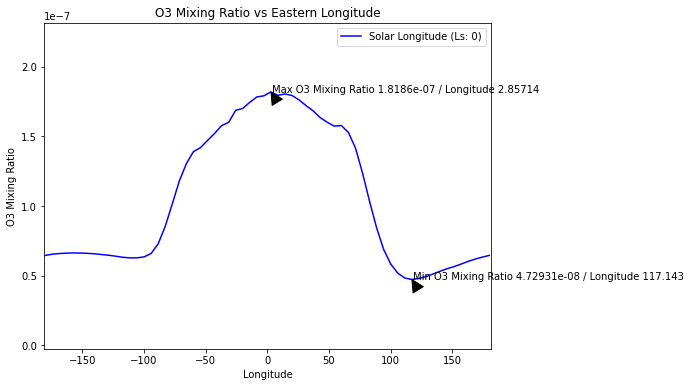

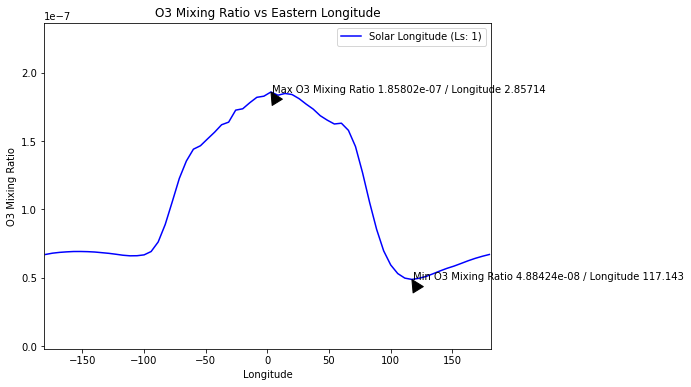

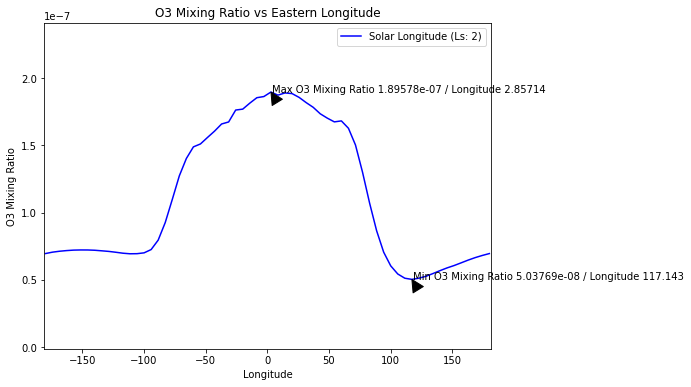

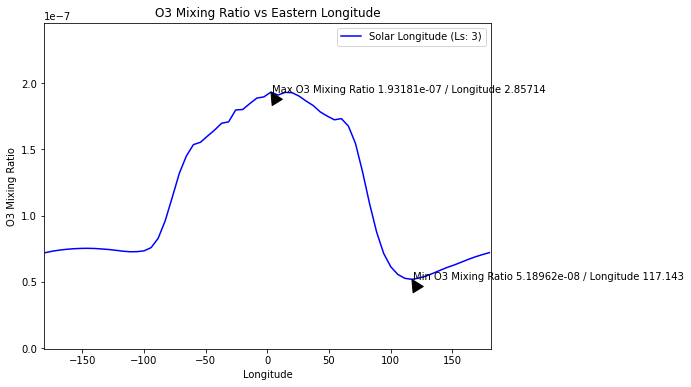

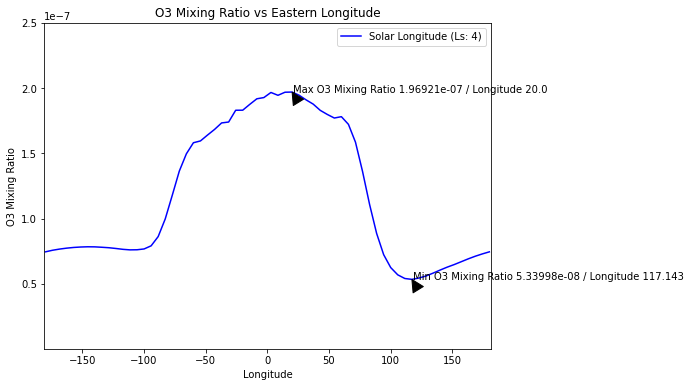

...

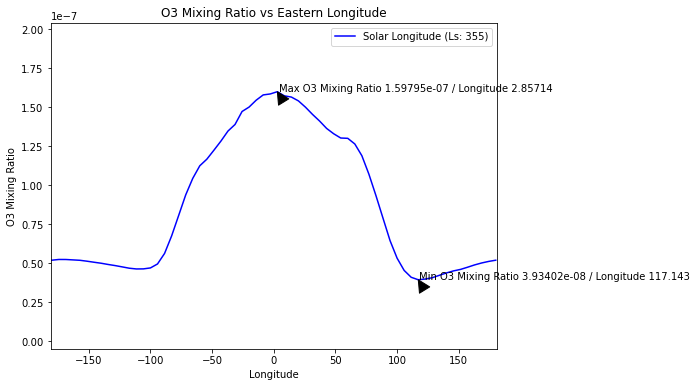

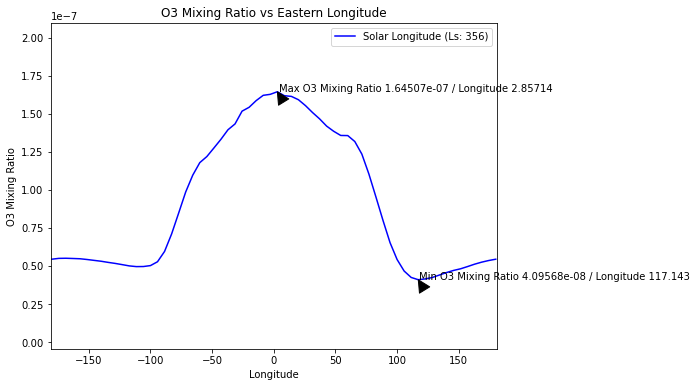

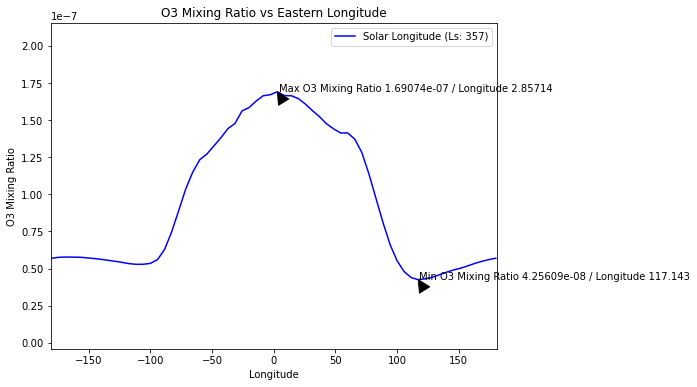

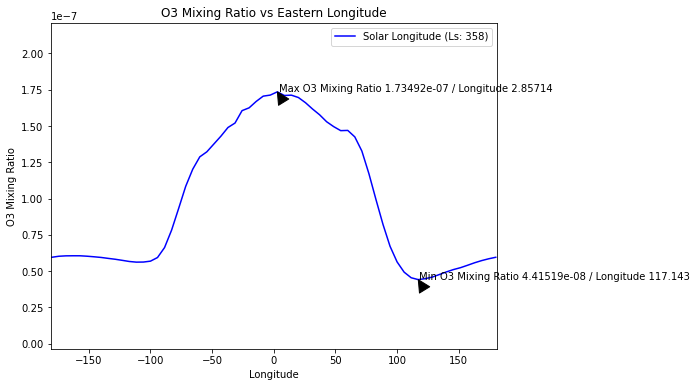

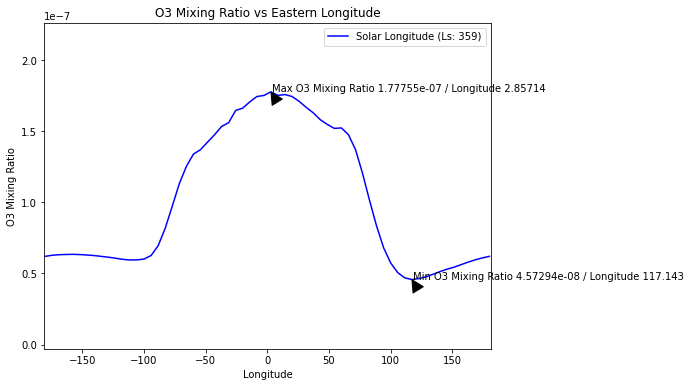

In [15]:
def create_gif(filenames, output_gif="o3_mixing_ratio_evolution_Ls0_to_360.gif", duration=0.2):
    valid_filenames = [f for f in filenames if os.path.exists(f) and os.path.getsize(f) > 0]
    if len(valid_filenames) <2:
        print("not enough frames to create gif")
        return
    
    images = [imageio.imread(f) for f in filenames] # Read images
    gif_path = os.path.join(frames_folder, output_gif)
    imageio.mimsave(gif_path, images, duration=duration)
    
    print(f"gif saved at {gif_path}")
    
    #removing indivudal frames:
    for f in filenames:
        os.remove(f)
        
        print(f"deleted frame {f}.")

filenames = create_plots(longitudes, temperatures)
create_gif(filenames)

# I have now made a gif that saves automatically to the computer of these temperatures and longitudes, for altitude of 30km, at latitude 60 for the entire martian year. 
Now that I've completed this for temperature, I need to grab the same for ozone density and ozone mixing ratio, as well as turning on winds to see the difference at longitude 60 altitude 30km.

I then need to try this for ...
